In [257]:
library(dplyr)   
library(caret)
library(tidyverse)
library(car)
library(MASS) # for chisq
library(descr) # for crosstable

options(repr.plot.width = 20, repr.plot.height =10, repr.plot.res = 500)

load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_iniziale.Rdata")
df <- DatiUsati1
rm(DatiUsati1)

In [258]:
df <- df[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps","leastOneEpathenal",
           "leastOneSpontaneousBacterial","thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "scoreCHILD","organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [259]:
# colestatiche




df <-  df %>% 
  mutate(colestatiche = case_when(liverDisords_cirrhosisBiliaryPrimitiv==1|liverDisords_cirrhosisBiliarySecond==1|
                                  liverDisords_primitScleroColangitis==1|
          liverDisords_extraEpathiBileDucts==1|liverDisords_otherCongenitBilia==1|
                                  liverDisords_otherCholestaticDisease==1~ 1,
                                  TRUE~ 0))

df$colestatiche <- as.factor(df$colestatiche)

df <- subset(df, select= - c(liverDisords_cirrhosisBiliaryPrimitiv,liverDisords_cirrhosisBiliarySecond,
                             liverDisords_primitScleroColangitis,liverDisords_extraEpathiBileDucts,
                            liverDisords_otherCongenitBilia, liverDisords_otherCholestaticDisease))



#rare

df <-  df %>% 
  mutate(rare = case_when(liverDisords_Hemochromatosis == 1|liverDisords_cirrhosisCryptogenetic == 1|
    liverDisords_cirrhosisOtherRaison == 1|liverDisords_otherIndication == 1|liverDisords_wilsonDisease == 1|
    liverDisords_cirrhosisDrugs == 1| liverDisords_buddChiariSyndrome == 1 | 
                          liverDisords_polycysticDisease == 1 | liverDisords_cirrhosisAutoimmune == 1 ~ 1,
                          TRUE ~ 0))

df$rare <- as.factor(df$rare)

df <- subset(df, select= - c(liverDisords_Hemochromatosis,liverDisords_cirrhosisCryptogenetic,
                             liverDisords_cirrhosisOtherRaison,liverDisords_otherIndication,liverDisords_wilsonDisease,
                            liverDisords_buddChiariSyndrome,liverDisords_polycysticDisease,liverDisords_cirrhosisAutoimmune))


#virali

df <-  df %>% 
  mutate(virali = case_when(liverDisords_cirrhosisVirusC == 1|liverDisords_cirrhosisVirusB == 1|
                            liverDisords_cirrhosisVirusD == 1|
                            liverDisords_cirrhosisVirusOther == 1 ~ 1,
                            TRUE ~ 0))

df$virali <- as.factor(df$virali)

df <- subset(df, select= - c(liverDisords_cirrhosisVirusC,liverDisords_cirrhosisVirusB,
                             liverDisords_cirrhosisVirusD,liverDisords_cirrhosisVirusOther))



#tumore

df <-  df %>% 
  mutate(tumore = case_when(liverDisords_HCCstageI == 1 | liverDisords_HCCstageII == 1 ~ 1,                 
                            TRUE ~ 0))

df$tumore <- as.factor(df$tumore)

df <- subset(df, select= - c(liverDisords_HCCstageI,liverDisords_HCCstageII))

In [260]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length)

Group.1,x
character,3
Date,1
factor,74
numeric,31


In [261]:
colnames(select_if(df, function(col) is.character(col)))

[1] "patientKey"             "icuAdmDate__icuAdmTime" "centreCode"

In [262]:
df$CentreCode <- as.factor(df$centreCode)

In [263]:
tmp <- unname(unlist(quantile(df$degenzaPostTraOSP, probs = c(0.9), na.rm=TRUE)))
df <- df %>% mutate(degenzaPostTraOSP = case_when(hospOutcome_RIC  %in% "hospDead" ~ tmp,
                                                  icuMortality %in% 1 ~ tmp,
                                                  TRUE ~ degenzaPostTraOSP))  #add penalty in degenzaPostTraOSP for patients who died

In [264]:
df1 <- df %>% filter(degenzaPostTraOSP <= 12)

df2 <- df %>% filter(degenzaPostTraOSP > 12)

In [265]:
paste("I pazienti con degenza minore o uguale a 12 giorni sono", nrow(df1))
paste("I pazienti con degenza superiore a 12 giorni", nrow(df2))

[1] "I pazienti con degenza minore o uguale a 12 giorni sono 474"

[1] "I pazienti con degenza superiore a 12 giorni 905"

In [266]:
# Data

print("<= 8")
summary(df1$icuAdmDate__icuAdmDate)

print("> 8")
summary(df2$icuAdmDate__icuAdmDate)

[1] "<= 8"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-01-05" "2019-09-29" "2020-08-12" "2020-07-08" "2021-05-05" "2021-12-31"

[1] "> 8"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-01-01" "2019-08-15" "2020-06-10" "2020-05-22" "2021-03-13" "2021-12-28"

In [267]:
# Orario (è una variabile "character" quindi posso confrontare solo in questo modo senza fare ulteriori modifche)

print("<= 8")
table(df1$icuAdmDate__icuAdmTime)

print("> 8")
table(df2$icuAdmDate__icuAdmTime)

[1] "<= 8"



00:05 00:10 00:15 00:28 00:30 00:34 00:45 01:00 01:02 01:15 01:25 01:29 01:30 
    1     1     2     1     2     1     1     1     1     1     1     1     1 
01:35 01:45 01:53 01:57 02:00 02:10 02:15 02:30 02:45 02:49 02:59 03:00 03:07 
    1     1     1     1     5     1     2     1     1     1     1     1     1 
03:10 03:12 03:18 03:29 03:36 03:43 03:45 03:56 04:00 04:30 04:33 04:35 05:00 
    1     1     1     1     1     1     1     1     5     2     1     1     1 
05:10 05:35 05:53 06:00 06:25 06:30 06:59 07:49 08:30 08:49 09:10 09:30 10:00 
    1     1     1     1     1     2     1     1     1     1     1     1     5 
10:10 10:30 10:44 11:00 11:19 11:24 11:30 11:36 11:45 11:58 12:00 12:03 12:05 
    1     1     1     1     1     1     1     1     1     1     5     1     1 
12:13 12:15 12:21 12:30 12:32 12:35 12:36 12:38 12:42 12:53 12:57 12:58 13:00 
    1     1     1     4     1     1     1     1     1     1     1     1     3 
13:02 13:03 13:04 13:10 13:16 13:27 13:30 13:33 13:

[1] "> 8"



00:00 00:10 00:15 00:20 00:25 00:30 00:35 00:40 00:45 00:50 00:56 01:00 01:17 
    1     2     1     3     1     3     1     1     1     2     1     9     1 
01:23 01:24 01:30 01:40 01:42 01:45 01:46 01:50 02:00 02:10 02:28 02:30 02:40 
    1     1     5     1     1     2     1     1     5     1     1     1     1 
03:00 03:30 03:31 03:50 03:53 04:00 04:01 04:07 04:14 04:15 04:30 04:36 04:45 
    5     4     1     3     1     5     1     1     1     1     4     1     1 
04:56 04:58 05:00 05:15 05:18 05:30 05:41 05:50 06:00 06:13 06:30 06:37 06:45 
    1     1     4     1     1     1     1     1     3     1     1     1     2 
07:00 07:10 07:15 07:25 07:27 07:30 07:33 07:35 07:40 08:00 08:09 08:24 08:30 
    3     2     1     1     1     3     1     1     1     7     1     1     3 
08:50 09:00 09:30 09:42 10:00 10:03 10:04 10:15 10:20 10:25 10:30 10:45 10:51 
    2     1     1     1     8     1     1     1     2     1     1     1     1 
11:00 11:10 11:19 11:24 11:30 11:35 11:40 11:43 11:

In [268]:
# Non usato

descrittiva_discrete <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {
            
            par(mfrow=c(1,2))
            print("<= 8")
            print(table(df1[[column]]))
            barplot(table(df1[[column]]), main="<= 8", col="blue", ylim = c(0, 500))

            print("<= 18")
            print(table(df2[[column]]))
            barplot(table(df2[[column]]), main="<= 18", col="blue", ylim = c(0, 500))
            
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
        }
        
}




descrittiva_continue <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            par(mfrow=c(1,2))

            print("<= 8")
            print(summary(df1[[column]]))
            hist(df1[[column]], main="<= 8", col="blue",ylim= c(0,500))

            print("<= 18")
            print(summary(df2[[column]]))
            hist(df2[[column]], main="<= 18", col="blue", ylim = c(0, 500))
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
        }
}

In [269]:
descrittiva_discrete <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {
            
            par(mfrow=c(1,2))
            barplot(table(df1[[column]])/nrow(df1), main="<= 8", col="blue", ylim = c(0, 1))

            barplot(table(df2[[column]])/nrow(df2), main="> 8", col="blue", ylim = c(0, 1))
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
            
        }
        
}




descrittiva_continue <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {


            print("<= 8")
            print(column)
            print(summary(df1[[column]]))

            print("> 8")
            print(column)
            print(summary(df2[[column]]))
            print(wilcox.test(df1[[column]], df2[[column]]))
            
            cat("\n\n\n\n")
            
        }
}

descrittiva_discrete2 <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            a <- table(factor(df1[[column]], levels = union(names(table(df2[[column]])),names(table(df1[[column]])))))
            b <- table(df2[[column]])
            
            print(column)
            print("<= 8")
            print(prop.table(a))
            
            print("> 8")
            print(prop.table(b))
        
            print(ks.test(a,b))
            
            cat("\n\n\n\n")
    }
}


descrittiva_discrete3 <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            a <- table(factor(df1[[column]], levels = union(names(table(df2[[column]])),names(table(df1[[column]])))))
            b <- table(df2[[column]])
            
            print(column)
        
            print(CrossTable(rbind(a, b),
           fisher = T, chisq = T, expected = T,
           prop.c = F, prop.t = F, prop.chisq = F, 
           sresid = T, format = 'SPSS', simulate.p.value=TRUE))
            
            cat("\n\n\n\n")
    }
}

In [270]:
df_discrete1 <- select_if(df1, function(col) is.factor(col))
df_discrete2 <- select_if(df2, function(col) is.factor(col))
                          
                          
df_continue1 <- select_if(df1, function(col) is.numeric(col))
df_continue2 <- select_if(df2, function(col) is.numeric(col))

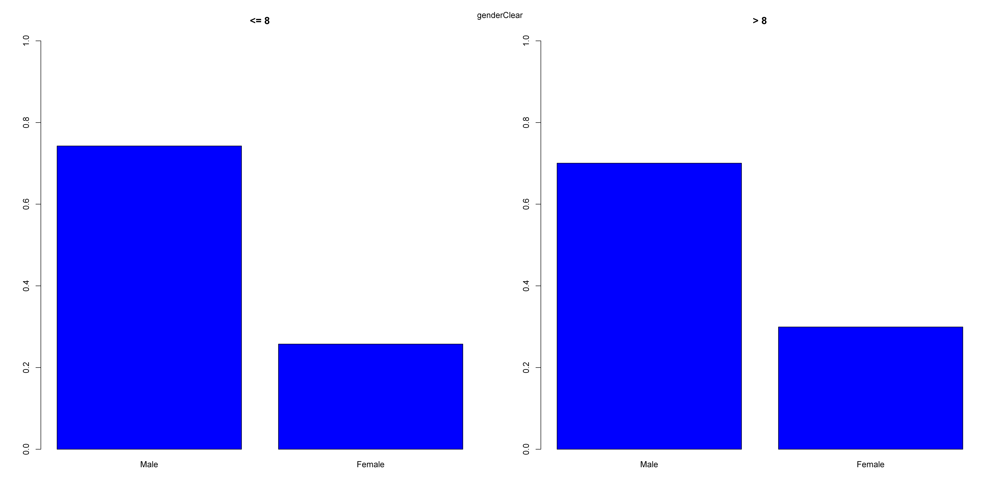

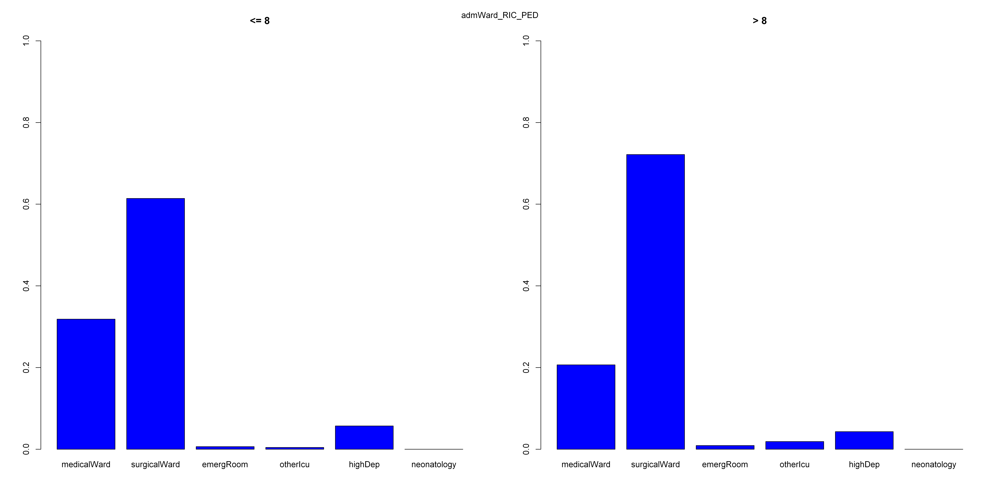

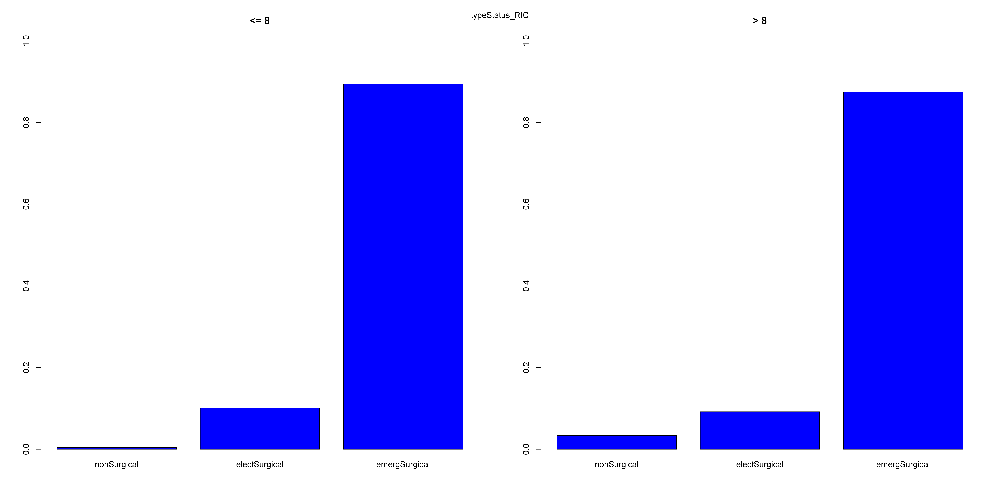

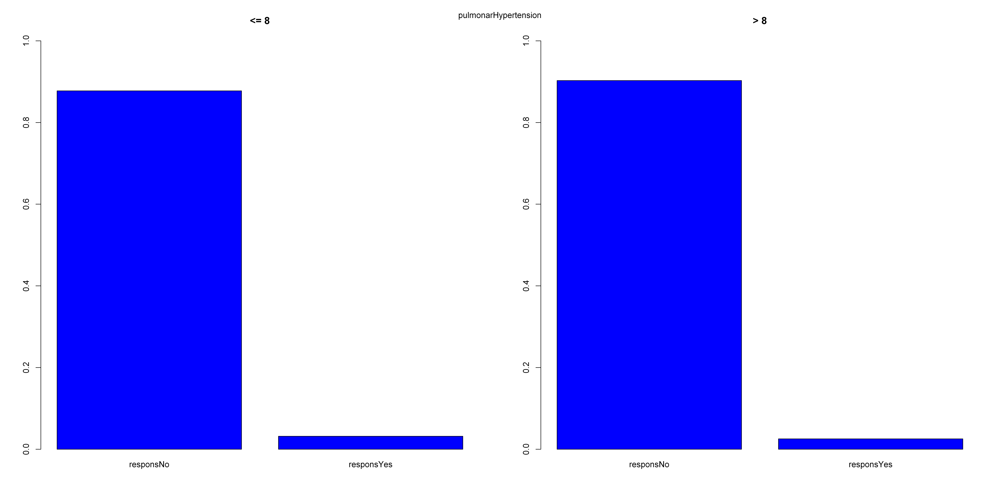

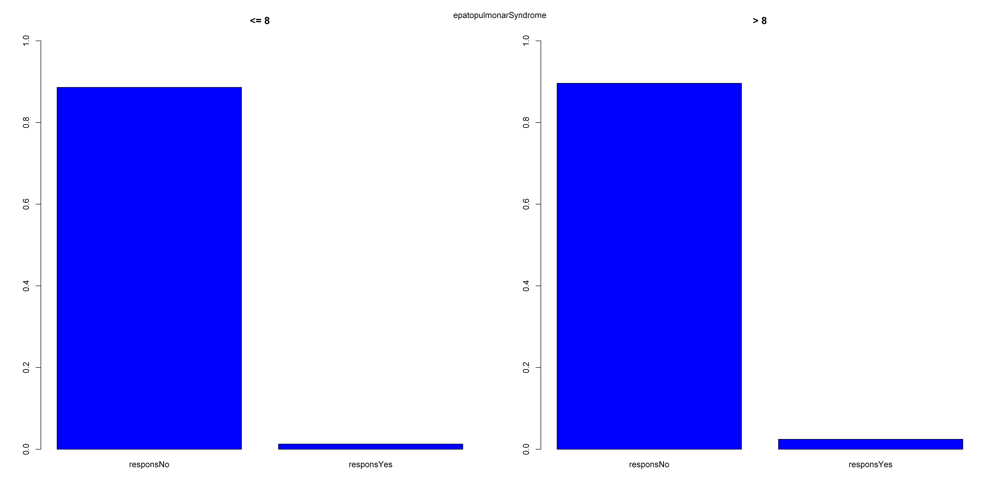

...

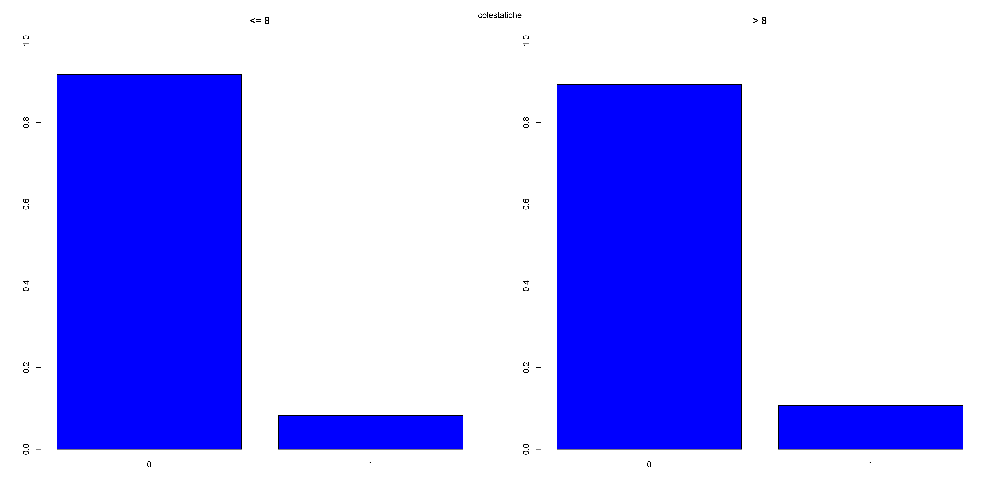

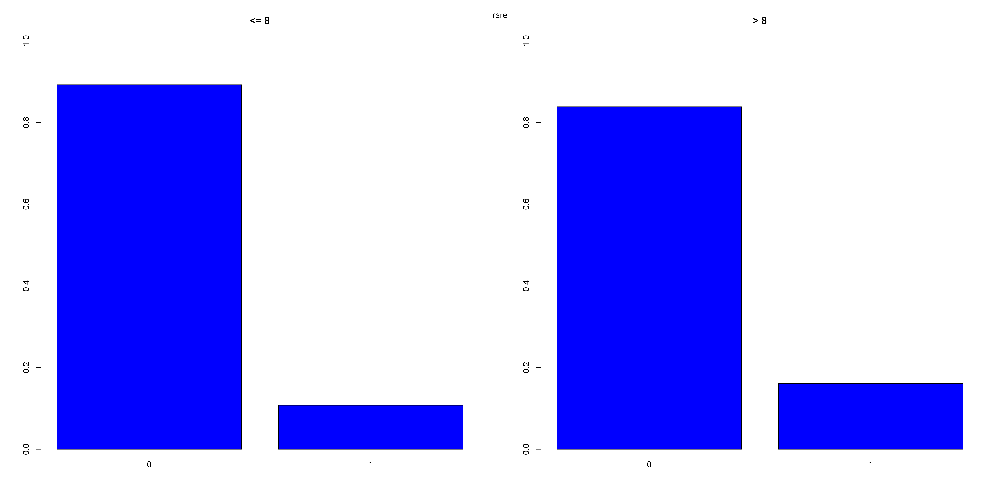

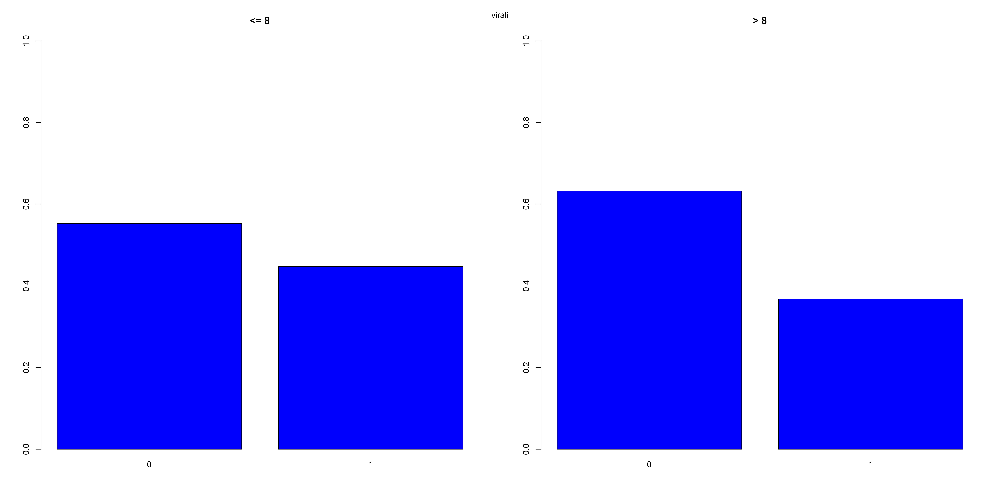

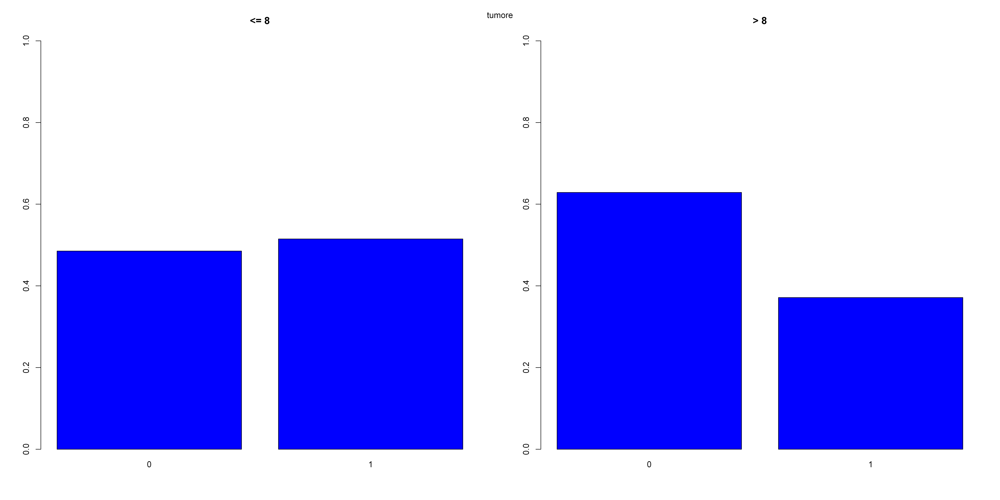

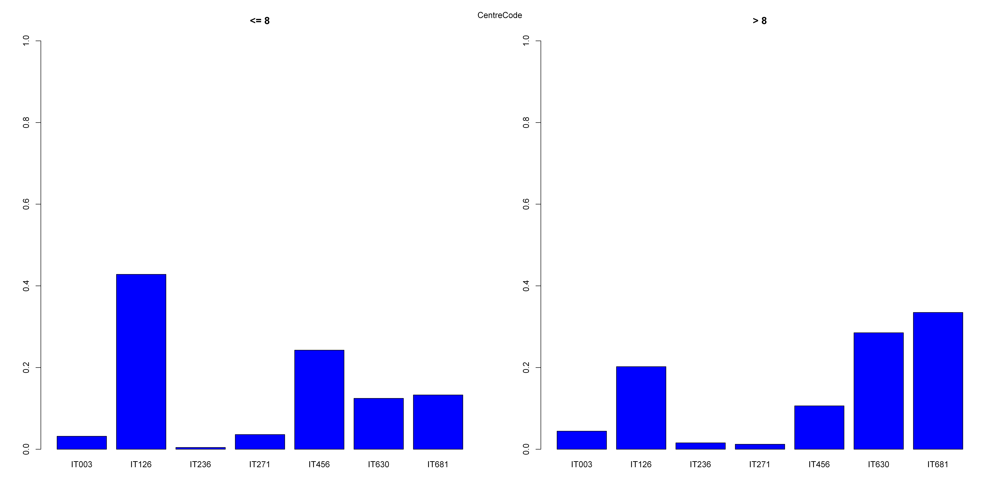

In [271]:
descrittiva_discrete(df_discrete1,df_discrete2)

In [272]:
descrittiva_discrete2(df_discrete1,df_discrete2)

[1] "genderClear"
[1] "<= 8"

    Male   Female 
0.742616 0.257384 
[1] "> 8"

     Male    Female 
0.7005525 0.2994475 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "admWard_RIC_PED"
[1] "<= 8"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.318565401  0.613924051  0.006329114  0.004219409  0.056962025  0.000000000 
[1] "> 8"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.206858407  0.722345133  0.008849558  0.018805310  0.043141593  0.000000000 


Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 0.8928
alternative hypothesis: two-sided





[1] "typeStatus_RIC"
[1] "<= 8"

  nonSurgical electSurgical emergSurgical 
  0.004219409   0.101265823   0.894514768 
[1] "> 8"

  nonSurgical electSurgical emergSurgical 
   0.03314917    0.09171271    0.87513812 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 1
alternative hypothesis: two-sided





[1] "pulmonarHypertension"
[1] "<= 8"

 responsNo responsYes 
0.96519722 0.03480278 
[1] "> 8"

 responsNo responsYes 
0.97261905 0.02738095 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "epatopulmonarSyndrome"
[1] "<= 8"

 responsNo responsYes 
0.98591549 0.01408451 
[1] "> 8"

 responsNo responsYes 
0.97358944 0.02641056 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "BleedingEsophagGastric"
[1] "

Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.6, p-value = 0.3291
alternative hypothesis: two-sided





[1] "albumInfusOver7Days"
[1] "<= 8"

 responsNo responsYes 
0.92018779 0.07981221 
[1] "> 8"

 responsNo responsYes 
 0.7727273  0.2272727 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "syndromeReperfus"
[1] "<= 8"

  notLevel       mild   moderate     severe 
0.35071090 0.43127962 0.17535545 0.04265403 
[1] "> 8"

  notLevel       mild   moderate     severe 
0.26474128 0.40914561 0.23826715 0.08784597 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.75, p-value = 0.2286
alternative hypothesis: two-sided





[1] "shuntPortedTemp"
[1] "<= 8"

 responsNo responsYes 
0.97877358 0.02122642 
[1] "> 8"

 responsNo responsYes 
0.97352587 0.02647413 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "anastomTechnic"
[1] "<= 8"



Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.2, p-value = 1
alternative hypothesis: two-sided





[1] "organDonorSteadyMacroscopic"
[1] "<= 8"

    under30      30to60       sup60 
0.940350877 0.056140351 0.003508772 
[1] "> 8"

   under30     30to60      sup60 
0.92307692 0.07692308 0.00000000 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 1
alternative hypothesis: two-sided





[1] "organDonorRecondHypoNormoter"
[1] "<= 8"

   Oxygenated NotOxygenated 
   0.94915254    0.05084746 
[1] "> 8"

   Oxygenated NotOxygenated 
    0.9122807     0.0877193 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_none_RIC"
[1] "<= 8"

        1         0 
0.1033755 0.8966245 
[1] "> 8"

         1          0 
0.05862832 0.94137168 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_asthma_RIC"


Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 0.9639
alternative hypothesis: two-sided





[1] "comorbidities_heartFail2_RIC"
[1] "<= 8"

          1           0 
0.008438819 0.991561181 
[1] "> 8"

         1          0 
0.01106195 0.98893805 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_heartFail4_RIC"
[1] "<= 8"

1 0 
0 1 
[1] "> 8"

1 0 
0 1 


Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 0.9639
alternative hypothesis: two-sided





[1] "comorbidities_arrhythmia_RIC"
[1] "<= 8"

         1          0 
0.03164557 0.96835443 
[1] "> 8"

         1          0 
0.03650442 0.96349558 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_perVascDis_RIC"
[1] "<= 8"

         1          0 
0.02742616 0.97257384 
[1] "> 8"

         1          0 
0.03318584 0.96681416 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_dementia_RIC"
[1] "<= 8"

1 0 
0 1 
[1] "> 8"

          1           0 
0.001106195 0.998893805 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_cerDis_RIC"
[1] "<= 8"

          1           0 
0.008438819 0.991561181 
[1] "> 8"

         1          0 


In [273]:
descrittiva_discrete3(df_discrete1,df_discrete2)

[1] "genderClear"
   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

           Male   Female   Total
--------------------------------
a          352      122     474 
         338.9    135.1         
          74.3%    25.7%   34.4%
         0.711   -1.126         
--------------------------------
b          634      271     905 
         647.1    257.9         
          70.1%    29.9%   65.6%
        -0.514    0.815         
--------------------------------
Total      986      393    1379 

Statistics for All Table Factors

Pearson's Chi-squared test with simulated p-value
	 (based on 2000 replicates) 
------------------------------------------------------------
Chi^2 = 2.701056      d.f. = NA      p = 0.103 

Pearson's Chi-squared test with simulated p-value
	 (based on 2000 replicates) 
---------------------------------------------------------

Warning message in chisq.test(tab, correct = FALSE, ...):
"cannot compute simulated p-value with zero marginals"
Warning message in chisq.test(tab, correct = FALSE, ...):
"Chi-squared approximation may be incorrect"


   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

         medclWrd   srgclWrd   emergRom   otherIcu   highDep   neontlgy    Total
--------------------------------------------------------------------------------
a            151        291          3          2        27          0      474 
           116.3      324.7        3.8        6.5      22.7        0.0          
            31.9%      61.4%       0.6%       0.4%      5.7%       0.0%    34.4%
           3.221     -1.871     -0.403     -1.774     0.902        NaN          
--------------------------------------------------------------------------------
b            187        653          8         17        39          0      904 
           221.7      619.3        7.2       12.5      43.3        0.0          
            20.7%      72.2%       0.9%       1.9%      4.3%       0.0%    65.6%

Warning message in chisq.test(tab, correct = FALSE, ...):
"cannot compute simulated p-value with zero marginals"
Warning message in chisq.test(tab, correct = FALSE, ...):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(tab, correct = TRUE, ...):
"cannot compute simulated p-value with zero marginals"
Warning message in chisq.test(tab, correct = TRUE, ...):
"Chi-squared approximation may be incorrect"


   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

            1        0   Total
------------------------------
a          0      474     474 
           0      474         
         0.0%   100.0%   34.4%
         NaN        0         
------------------------------
b          0      904     904 
           0      904         
         0.0%   100.0%   65.6%
         NaN        0         
------------------------------
Total      0     1378    1378 

Statistics for All Table Factors

Pearson's Chi-squared test 
------------------------------------------------------------
Chi^2 = NaN      d.f. = 1      p = NA 

Pearson's Chi-squared test 
------------------------------------------------------------
Chi^2 = NaN      d.f. = 1      p = NA 

 
Fisher's Exact Test for Count Data
------------------------------------------------------------
Sample estimate

Warning message in chisq.test(tab, correct = FALSE, ...):
"cannot compute simulated p-value with zero marginals"
Warning message in chisq.test(tab, correct = FALSE, ...):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(tab, correct = TRUE, ...):
"cannot compute simulated p-value with zero marginals"
Warning message in chisq.test(tab, correct = TRUE, ...):
"Chi-squared approximation may be incorrect"


   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

            1        0   Total
------------------------------
a          0      474     474 
           0      474         
         0.0%   100.0%   34.4%
         NaN        0         
------------------------------
b          0      904     904 
           0      904         
         0.0%   100.0%   65.6%
         NaN        0         
------------------------------
Total      0     1378    1378 

Statistics for All Table Factors

Pearson's Chi-squared test 
------------------------------------------------------------
Chi^2 = NaN      d.f. = 1      p = NA 

Pearson's Chi-squared test 
------------------------------------------------------------
Chi^2 = NaN      d.f. = 1      p = NA 

 
Fisher's Exact Test for Count Data
------------------------------------------------------------
Sample estimate

In [274]:
descrittiva_continue(df_continue1, df_continue2)

[1] "<= 8"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  14.00   53.00   58.50   56.66   64.00   75.00 
[1] "> 8"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   52.00   57.00   55.76   63.00   75.00 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 229820, p-value = 0.02891
alternative hypothesis: true location shift is not equal to 0





[1] "<= 8"
[1] "degenzaPreTra"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   2.186   1.000  72.000 
[1] "> 8"
[1] "degenzaPreTra"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 -1.000   0.000   1.000   7.466   4.000 304.000       1 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 173155, p-value = 3.605e-10
alternative hypothesis: true location shift is not equal to 0





[1] "<= 8"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.200   0.760   1